<center>
<h1><b>
Cartridge Case Feature Identification for Forensic Analysis</b><h1>
</center>

## Note: For quick run - Just run from the **4. Modelling** part

## Questions for Investigation

1. How can we automatically classify the features present on cartridge case images, thus aiding forensic analysis and contributing to criminal investigations by leveraging the power of Machine Learning and following the CRISP-DM approach?

2. What are the primary characteristics or patterns discernible in cartridge case images that can inform the design of an algorithm for feature identification and masking?

## Project Overview

The purpose of this project is to develop a machine learning algorithm that can identify and mask specific features on cartridge case images. This tool will support forensic analysts in the examination of evidence related to firearm use in criminal activity.

## **1. Business Understanding**
### Objective
To enhance forensic analysis efficiency by automating the identification and masking of features on cartridge case images, such as the breech-face impression, aperture shear, firing pin impression, firing pin drag, and the direction of the firing pin drag.

### Significance
An automated process for feature identification can greatly reduce the time and effort required in forensic investigations, leading to quicker and more accurate outcomes in criminal cases.

## Research Context
The study detailed in Duong L. et al., 2023, provides a foundational understanding of the application of image processing techniques in forensic evidence analysis. Insights from this research will guide the development of our algorithm.

## **2. Data Understanding**

Following the CRISP-DM approach, delve into understanding our data through several key steps: collection of initial data, description of the data, exploration of the data, and verification of data quality.

### Collect Initial Data
The dataset comprises 2625 topographic scans of breech face impressions on fired cartridge case primers, sourced from the Defense Forensic Science Center (DFSC) Ames Lab I study. This rich dataset provides a foundation for developing and validating algorithms for processing and comparing cartridge case features.

### Describe Data
Each entry in the dataset represents a high-resolution topographic scan of a cartridge case primer. These images capture the unique markings and impressions left on the cartridge case after it has been fired, which are crucial for forensic analysis.





In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

In [ ]:
image_directory = '/content/drive/MyDrive/Forensic_Dataset/raw-snapshot'

In [ ]:
image_files = [os.path.join(image_directory, file) for file in os.listdir(image_directory) if file.lower().endswith('.png')]

### Explore Data
Initial exploration of the dataset will involve:
- Visual inspection of a subset of images to understand the variety and complexity of the features.
- Statistical analysis of image properties, such as resolution, dimensions, and color depth, to prepare for preprocessing steps.
- Checking for any patterns or anomalies that may be present in the scans, such as common markings or defects.


#### Visual inspection of a subset of images (Samples)

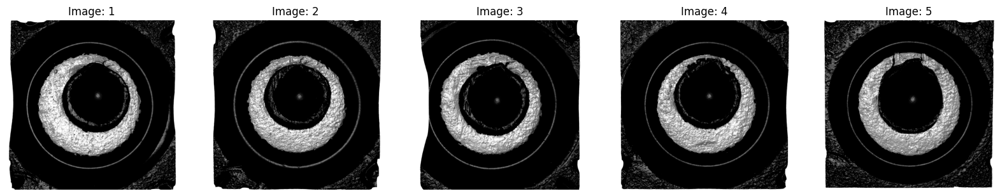

In [ ]:
def display_images(image_paths, num_images=5):
    plt.figure(figsize=(20, 10))
    for i in range(num_images):
        img_path = image_paths[i]
        img = Image.open(img_path)
        plt.subplot(1, num_images, i + 1)
        plt.imshow(img)
        plt.title(f'Image: {i+1}')
        plt.axis('off')
    plt.show()

display_images(image_files)

#### Statistical analysis of image properties


In [ ]:
image_properties = {
    'width': [],
    'height': [],
    'color_depth': []
}

for img_path in image_files:
    img = cv2.imread(img_path)
    image_properties['height'].append(img.shape[0])
    image_properties['width'].append(img.shape[1])
    image_properties['color_depth'].append(img.shape[2] if len(img.shape) > 2 else 1)


#### Plotting the distribution of image dimensions


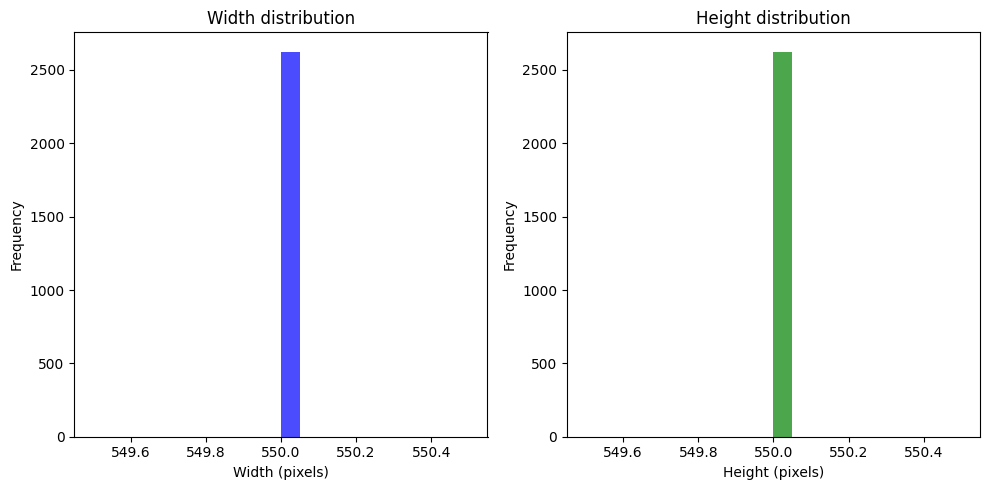

In [ ]:
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.hist(image_properties['width'], bins=20, color='blue', alpha=0.7)
plt.title('Width distribution')
plt.xlabel('Width (pixels)')
plt.ylabel('Frequency')

plt.subplot(1, 2, 2)
plt.hist(image_properties['height'], bins=20, color='green', alpha=0.7)
plt.title('Height distribution')
plt.xlabel('Height (pixels)')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

### Here, we can see all image data have the same width and height frequency.

### Verify Data Quality
Assessing the quality of the dataset will be critical in ensuring the reliability of the machine learning model. This will include:
- Ensuring there are no corrupted files or unreadable scans.
- Confirming that the dataset is representative of the variety of cases likely to be encountered in real-world forensic analysis.
- Identifying any missing data or anomalies that could affect the training process of the machine learning model.


##### **Check-up for corrupted files or unreadable scans**

In [ ]:
def verify_images(image_paths):
    corrupted = []
    for img_path in image_paths:
        try:
            img = Image.open(img_path)
            img.verify()
        except (IOError, SyntaxError) as e:
            corrupted.append(img_path)
    return corrupted

corrupted_images = verify_images(image_files)
print(f"Number of corrupted images: {len(corrupted_images)}")

Number of corrupted images: 0


In [ ]:
anomalies = [img_path for img_path in image_files if os.path.getsize(img_path) < 90]
print(f"Number of anomalous images: {len(anomalies)}")

Number of anomalous images: 0


## **3. DATA PRE-PROCESSING**

Data preprocessing is a critical step in preparing the dataset for effective machine learning model training. Since the dataset consists only of images without any labels, we will need to undertake a manual annotation process to identify the following features on the cartridge cases:

1. The breech-face impression
2. The aperture shear
3. The firing pin impression
4. The firing pin drag
5. The direction of the firing pin drag

Given the large number of images (2625 in total), manual annotation of the entire dataset is not feasible within a short time frame. To address this, we will employ a two-step strategy:

### Clustering and Outlier Detection
Firstly, apply clustering algorithms to group the images into clusters based on their visual similarity. This will help to identify patterns and common features across the images, potentially reducing the number of unique annotations needed. Furthermore, outlier detection will be employed to separate any anomalous images that may require special attention or could be indicative of rare but significant features.

### Random Sampling for Annotation
From each cluster, I will randomly select a subset of images (approximately 500 in total) for manual annotation. This approach ensures that we have a representative sample of the dataset's diversity while keeping the annotation task manageable.

### Data Augmentation
To augment our dataset and ensure we have sufficient data for training, we will use data augmentation techniques. This includes geometric transformations such as rotations, translations, scaling, and flips, as well as photometric transformations like brightness or contrast adjustments. Data augmentation helps to introduce variability into the dataset, which can improve the robustness and generalization of the machine learning model.

By following this strategy, I aim to create a well-curated and annotated dataset that can be effectively used to train a machine learning model capable of identifying and masking the specific features of cartridge cases in a forensic context.


### 3.1 Clustering and Outlier Detection

Essentially, clustering is employed to group images based on visual similarity, which serves two main purposes: it reduces the workload for manual annotation and ensures that our annotated dataset captures the diversity of features present in the entire collection.

### Feature Extraction
To prepare for clustering, firstly, extract features from each image using a Convolutional Neural Network (CNN). Specifically, Utilize the VGG16 model pre-trained on ImageNet, which is well-suited for capturing the essence of visual content. Then process each image to fit the input requirements of the model and extract the features from the last convolutional layer.

### Image Paths and Feature Collection
Collate the paths to all the images in the dataset and perform feature extraction in a batch process. This results in a feature array where each row corresponds to the flattened feature vector of an image.

By the end of this preparation phase, I will have a structured array of features ready for the clustering algorithm, which will form the basis for the image similarity groups.

In [ ]:
import os
import numpy as np
from keras.preprocessing import image
from keras.applications.vgg16 import VGG16, preprocess_input
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

# Implementing the pre-trained VGG16 model
model = VGG16(weights='imagenet', include_top=False)

def extract_features(img_path, model):
    img = image.load_img(img_path, target_size=(550, 550))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = preprocess_input(img_array)
    features = model.predict(img_array)
    return features.flatten()

# Directory path of the images
directory = "/content/drive/MyDrive/Forensic_Dataset/raw-snapshot"

# Extracting features
image_paths = [os.path.join(directory, x) for x in os.listdir(directory) if x.lower().endswith(('.png')]
features = np.array([extract_features(img_path, model) for img_path in image_paths])


1/1 [==============================] - 0s 21ms/step


### 3.1.1 Determining the Optimal Number of Clusters

The determination of the optimal number of clusters is a crucial step in the clustering process, as it directly influences the granularity of the image grouping.

#### Knee Locator Function
Utilizing the `kneed` package's `KneeLocator` function, which programmatically identifies the elbow point in the Within-Cluster-Sum of Squares (WCSS) plot — the point beyond which the gain in explained variance within the cluster tends to decrease, indicating a reasonable trade-off between cluster count and model complexity.


In [ ]:
!pip install kneed

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

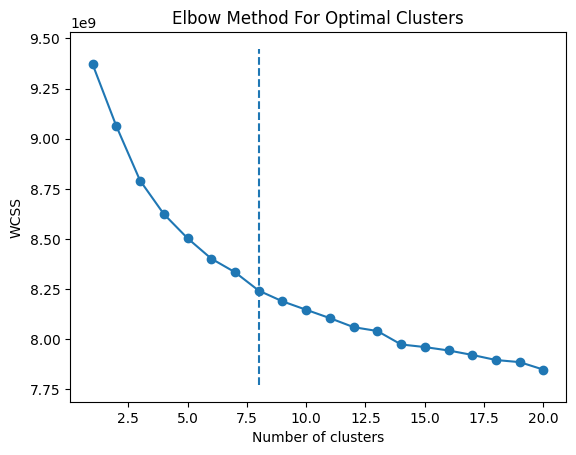

Optimal number of clusters found: 8


In [ ]:
from kneed import KneeLocator
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Calculate the within-cluster sum of squares (WCSS) for a range of cluster counts
def calculate_wcss(data):
    wcss = []
    for n in range(1, 21):
        kmeans = KMeans(n_clusters=n, random_state=42)
        kmeans.fit(data)
        wcss.append(kmeans.inertia_)
    return wcss

# finding the elbow point
def find_elbow_point(wcss):
    kn = KneeLocator(range(1, 21), wcss, curve='convex', direction='decreasing')
    return kn.elbow

wcss = calculate_wcss(features)
optimal_clusters = find_elbow_point(wcss)

# Plotting the elbow graph with the optimal number of clusters
plt.figure()
plt.plot(range(1, 21), wcss, marker='o')
plt.title('Elbow Method For Optimal Clusters')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.vlines(optimal_clusters, plt.ylim()[0], plt.ylim()[1], linestyles='dashed')
plt.show()

print(f"Optimal number of clusters found: {optimal_clusters}")

> Here we can see the **Optimal number of clusters is 8**.



Despite, I would like to find the optimal number of clusters using the normal ELBOW method.

#### Elbow Method

By plotting the WCSS against a range of cluster numbers. This visual method allows us to examine the rate of decrease and identify the elbow point manually, providing a comparative view against the KneeLocator's output.

In [ ]:
import matplotlib.pyplot as plt
import shutil

# Optimal number of clusters (Elbow Method)
wcss = []
for i in range(1, 21):
    kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=100, n_init=10, random_state=0)
    kmeans.fit(features)
    wcss.append(kmeans.inertia_)

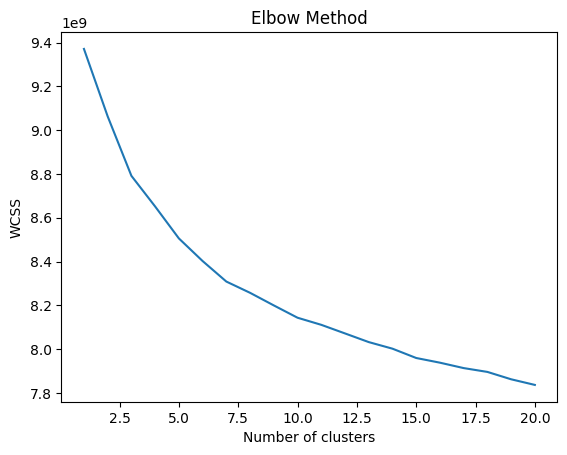

In [ ]:
# Plot the elbow graph
plt.plot(range(1, 21), wcss)
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

As a comparison from the both result,
1. Knee locator locate 8 but in
2. Elbow method the graph bend at number 10 and 11.

So, I fixed the **optimal clusters is 10**.

### PCA for Dimensionality Reduction

Having determined the optimal number of clusters, proceeding with dimensionality reduction and clustering to efficiently categorize our dataset.

To manage the high-dimensional feature space extracted from the images, I apply Principal Component Analysis (PCA).


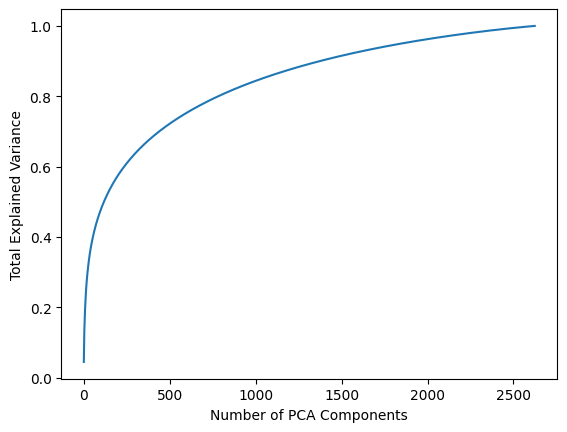

In [ ]:
# Findig Optimal PCA Components
pca = PCA().fit(features)
plt.figure()
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of PCA Components')
plt.ylabel('Total Explained Variance')
plt.show()

> From the above graph experimentation, **I select 900 components for PCA**.

In [ ]:
n_components=900

In [ ]:
# Apply PCA
pca = PCA(n_components, random_state=20)
reduced_features = pca.fit_transform(features)

In [ ]:
total_explained_variance = sum(pca.explained_variance_ratio_)
print(f"The optimal components explain {total_explained_variance * 100:.2f}% of the variance in the data.")

The optimal components explain 82.16% of the variance in the data.


This **reduced features explains 82.16% of the variance** in data. This reduction in dimensionality aids in more efficient clustering while retaining the majority of the data's informational content.

#### PCA, Clustering, and Outlier Detection

#### K-Means Clustering
With the features now reduced in dimensionality, I employ K-Means clustering with 10 clusters (as determined by our earlier analysis). This step categorizes the images into 10 distinct groups based on visual similarity.


In [ ]:
optimal_clusters = 10

In [ ]:
# Clustering
kmeans = KMeans(n_clusters=optimal_clusters, random_state=22)
clusters = kmeans.fit_predict(reduced_features)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


#### Outlier Detection
In addition to clustering, I perform outlier detection to identify any images that significantly deviate from common patterns. I use a percentile-based approach to flag the top 5% of images with the highest distance from cluster centroids as outliers.

In [ ]:
# Detecting outliers
distances = kmeans.transform(reduced_features)
outlier_score = np.min(distances, axis=1)
threshold = np.percentile(outlier_score, 95)
outliers = np.where(outlier_score > threshold)[0]

In [ ]:
# let's copy images
for i in range(optimal_clusters):
    os.makedirs(os.path.join(directory, f'cluster_{i}'), exist_ok=True)
os.makedirs(os.path.join(directory, 'outliers'), exist_ok=True)

for idx, path in enumerate(image_paths):
    if idx in outliers:
        shutil.copy2(path, os.path.join(directory, 'outliers', os.path.basename(path)))
    else:
        cluster_idx = clusters[idx]
        shutil.copy2(path, os.path.join(directory, f'cluster_{cluster_idx}', os.path.basename(path)))

#### Output of Clustering, and Outlier Detection

![picture](https://drive.google.com/uc?export=view&id=1SnWRsygbnmBY5TKJJfDPJPPGYlo9-_Aw)

### 3.1.2 Random Sampling for Annotation

With the images clustered and outliers identified, the next step is to select a representative sample of images for manual annotation. Random sampling ensures that the diversity of the dataset is adequately captured in the subset selected for this intensive task.


In [ ]:
import random

# I Assume the total number of images are 505.
total_samples = 505
samples_per_cluster = total_samples // (optimal_clusters + 1)

# Creating Directory for storing selected samples
selected_samples_dir = os.path.join(directory, 'selected_samples')
os.makedirs(selected_samples_dir, exist_ok=True)

def random_sampling_from_folder(folder_path, num_samples):
    images = [os.path.join(folder_path, f) for f in os.listdir(folder_path) if f.lower().endswith('.png')]
    selected_images = random.sample(images, min(len(images), num_samples))
    for img in selected_images:
        shutil.copy2(img, os.path.join(selected_samples_dir, os.path.basename(img)))

for i in range(optimal_clusters):
    cluster_folder = os.path.join(directory, f'cluster_{i}')
    random_sampling_from_folder(cluster_folder, samples_per_cluster)

outlier_folder = os.path.join(directory, 'outliers')
random_sampling_from_folder(outlier_folder, samples_per_cluster)

print(f"Random sampling completed. Selected samples are stored in: {selected_samples_dir}")

Random sampling completed. Selected samples are stored in: 505


As a result, now we **got 505 samples** to start the data annotation.

#### 3.1.3 Data Annotation with Roboflow

For this project, I utilize Roboflow, a robust tool that facilitates the annotation of images for computer vision tasks.
</br></br>

#### Annotation Process
Roboflow offers various tools such as polygon and smart polygon, which are essential for accurately labeling the complex and detailed features on the cartridge cases. Each image is meticulously annotated to mark the specified features, ensuring that the model receives high-quality training data.

Here is an example of an annotated image showcasing the identified features:
![picture](https://drive.google.com/uc?export=view&id=1x3pwSe-vY19dswM5Vss512u3pHC9otD4)

#### 3.1.2 Data Augmentation

Data augmentation is an essential technique in machine learning, especially in the context of image data. It helps to increase the diversity of our dataset by introducing variations, thereby enabling the model to generalize better. For this project, we used a series of augmentation techniques to enhance our dataset.
<br><br>
#### *Augmentation Techniques Applied*
The following augmentation methods were applied to our images:
- **Auto Orientation**: Correcting the image orientation.
- **Resizing**: Standardizing all images to a uniform size of 550x550 pixels.
- **Flipping**: Both horizontal and vertical flips to introduce variability in orientation.
- **Cropping**: Applying random crops with a zoom range of 0% to 20%, which aids in focusing on different parts of the images.
- **Rotation**: Rotating the images between -15 to +15 degrees to simulate different angles of cartridge cases.
- **Shear**: Applying shear transformations to mimic different perspectives.
<br><br>

#### *Generation of Augmented Images*
Through these augmentation methods, we successfully generated 1921 augmented images from our annotated dataset. These additional images enhance our dataset by representing various transformations that a cartridge case might undergo in real-world scenarios.

![picture](https://drive.google.com/uc?export=view&id=1SpAN8dtfoFz6PtM_Nt8xNAsLrYFrYA1w)

<br><br>

#### Dataset Split
We divided our dataset into three subsets: Train, Test, and Validation. This split ensures that the model is trained on a diverse set of data, evaluated on unseen data, and validated on a separate set to check for overfitting or underfitting. The dataset was split as follows:
- **Train Set**: 1770 images, used for training the model.
- **Test Set**: 50 images, used to test the model's performance on unseen data.
- **Validation Set**: 101 images, used to validate the model during training to fine-tune parameters and prevent overfitting.

#### Summary
The application of data augmentation and careful dataset splitting is vital in developing a robust machine learning model. It not only provides the model with a rich variety of data to learn from but also ensures that the model's performance is accurately assessed and validated.

![picture](https://drive.google.com/uc?export=view&id=1mT_RgWntSv8TCN0xAcQjq3nHokCrJF1Y)


***This split ensures that the model has a substantial amount of data for learning while providing adequate data for evaluation and fine-tuning.***

The augmented images, along with the original annotated set, form a comprehensive dataset that is now ready to be fed into the machine learning pipeline for training and evaluation.

**As a result, I got 1921 images with labels.**


## **4. Modeling**

### Modelling with Detectron2

I describe the process of training a machine learning model using Detectron2, a state-of-the-art framework for object detection and segmentation. Our goal is to train a model that can accurately identify and segment the defined features in cartridge case images.


In [1]:
!pip install roboflow

#### **Step 1:** Setting Up the Environment
First, installing necessary packages including Roboflow and Detectron2. Roboflow is used for dataset management and Detectron2 for the modelling process.


**NOte: Plese use your Roboflow api_key below**
**(OR)**
**You can use the Annotated Data file masking_catridge-2.zip**

In [2]:
from roboflow import Roboflow
rf = Roboflow(api_key="**your Roboflow api_key**")
project = rf.workspace("jino").project("masking_catridge")
dataset = project.version(2).download("coco-segmentation")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to masking_catridge-2 in coco-segmentation:: 100%|██████████| 1928/1928 [00:00<00:00, 5143.67it/s]


In [3]:
!python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-sxqb9fge
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-sxqb9fge
  Resolved https://github.com/facebookresearch/detectron2.git to commit 864913f0e57e87a75c8cc0c7d79ecbd774fc669b
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 1.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 6.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 21.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 78.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.0/117.0 kB 18.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for detectron2: filename=detectron2-0.6-cp310-cp310-linux_x86_64.whl size=6119167 sha256=315f4b37cd23fce880d8f5a28919

#### **Step 2:** Verifying CUDA and Torch Versions

Checking the CUDA and Torch versions to ensure compatibility with Detectron2.

In [4]:
import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2023 NVIDIA Corporation
Built on Tue_Aug_15_22:02:13_PDT_2023
Cuda compilation tools, release 12.2, V12.2.140
Build cuda_12.2.r12.2/compiler.33191640_0
torch:  2.1 ; cuda:  cu121
detectron2: 0.6


#### **Step 3:** Registering Datasets

Using Detectron2’s dataset registration functionality, we register our dataset for training, validation, and testing.

In [5]:
from detectron2.data.datasets import register_coco_instances

register_coco_instances("Masking-Case-1-train", {}, "/content/masking_catridge-2/train/_annotations.coco.json", "/content/masking_catridge-2/train")
register_coco_instances("Masking-Case-1-val", {}, "/content/masking_catridge-2/valid/_annotations.coco.json", "/content/masking_catridge-2/valid")
register_coco_instances("Masking-Case-1-test", {}, "/content/masking_catridge-2/test/_annotations.coco.json", "/content/masking_catridge-2/test")

#### **Step 4:** Inspecting the Dataset
Using the Visualizer in Detectron2 to inspect the registered dataset and ensure that the data is correctly formatted and ready for training.

In [6]:
from detectron2.utils.visualizer import Visualizer
from detectron2.data import DatasetCatalog, MetadataCatalog
import random
import cv2
from matplotlib import pyplot as plt

In [7]:
[
    data_set
    for data_set
    in MetadataCatalog.list()
    if data_set.startswith("Masking-Case-1")
]

['Masking-Case-1-train', 'Masking-Case-1-val', 'Masking-Case-1-test']

In [11]:
from detectron2.data import MetadataCatalog
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
from detectron2 import model_zoo
import os

dataset_name = "Masking-Case-1-train"  # Registered train dataset name
metadata = MetadataCatalog.get(dataset_name)
class_names = metadata.thing_classes

print("Class names and indices:")
for idx, name in enumerate(class_names):
    print(f"{idx}: {name}")

Class names and indices:
0: The-breech-face-impression
1: The aperture shear
2: The breech-face impression
3: The firing pin drag
4: The firing pin impression


#### **Step 5:** Model Configuration
Configuring the model using a pre-trained Mask R-CNN architecture provided by Detectron2’s model zoo, setting parameters like learning rate, batch size, and number of iterations.

In [12]:
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("Masking-Case-1-train",)
cfg.DATASETS.TEST = ("Masking-Case-1-val",)
cfg.DATALOADER.NUM_WORKERS = 4
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR = 0.001
cfg.SOLVER.MAX_ITER = 3000
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 5  # Set number of classes in the dataset

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)

[01/22 15:02:28 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
roi_heads.mask_head.predictor.{bias, weight}


#### **Step 6:** Training the Model
Initiating the training process, allowing Detectron2’s DefaultTrainer to handle the training loop.

In [13]:
trainer.train()


[01/22 15:02:40 d2.engine.train_loop]: Starting training from iteration 0


torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3526.)


[01/22 15:02:49 d2.utils.events]:  eta: 0:09:31  iter: 19  total_loss: 2.909  loss_cls: 1.589  loss_box_reg: 0.3429  loss_mask: 0.6892  loss_rpn_cls: 0.264  loss_rpn_loc: 0.03967    time: 0.2146  last_time: 0.1985  data_time: 0.0171  last_data_time: 0.0082   lr: 1.9981e-05  max_mem: 3060M
[01/22 15:02:56 d2.utils.events]:  eta: 0:09:27  iter: 39  total_loss: 2.27  loss_cls: 0.9528  loss_box_reg: 0.3884  loss_mask: 0.6726  loss_rpn_cls: 0.2016  loss_rpn_loc: 0.03496    time: 0.2086  last_time: 0.2028  data_time: 0.0083  last_data_time: 0.0097   lr: 3.9961e-05  max_mem: 3060M
[01/22 15:03:00 d2.utils.events]:  eta: 0:09:22  iter: 59  total_loss: 1.759  loss_cls: 0.5085  loss_box_reg: 0.4505  loss_mask: 0.6524  loss_rpn_cls: 0.1199  loss_rpn_loc: 0.0312    time: 0.2027  last_time: 0.1891  data_time: 0.0083  last_data_time: 0.0083   lr: 5.9941e-05  max_mem: 3060M
[01/22 15:03:04 d2.utils.events]:  eta: 0:09:18  iter: 79  total_loss: 1.608  loss_cls: 0.4415  loss_box_reg: 0.4542  loss_mask:

#### Tensorboard curves during training

In [15]:
%load_ext tensorboard
%tensorboard --logdir output

Output hidden; open in https://colab.research.google.com to view.

#### Visualizing the prediction of the First file from the test data

Here is the part, I'm implementing the fifth feature
>i.e.**The direction of the firing pin drag**


An important aspect of our analysis involves identifying the direction of the firing pin drag on the cartridge case. This is achieved through a process of geometric calculations on the image data.

### Process Overview
The direction of the firing pin drag is determined by first finding the center points of two key features:
1. **Firing Pin Impression**
2. **Firing Pin Drag**

Once these center points are identified, an arrow is drawn from the center of the firing pin impression to the center of the firing pin drag. This arrow visually represents the direction in which the firing pin moved across the cartridge case surface.

[01/22 15:14:03 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


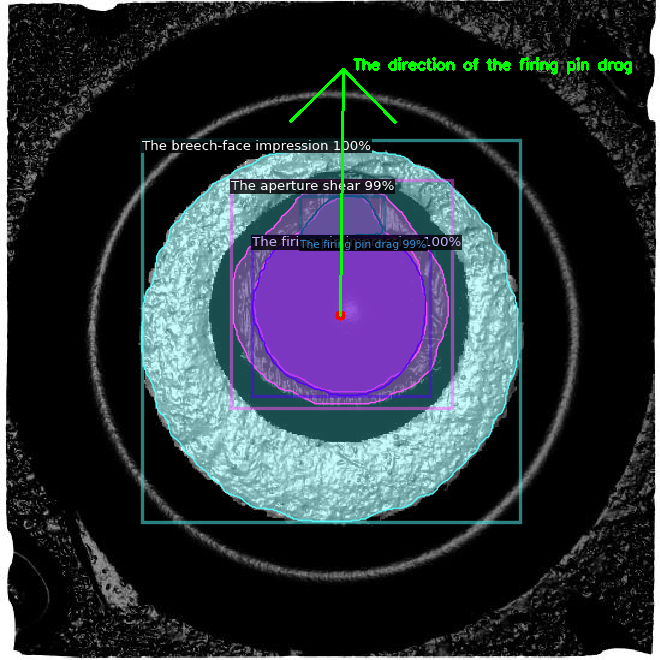

In [17]:
from detectron2.engine import DefaultPredictor
from detectron2.data import MetadataCatalog, DatasetCatalog
from google.colab.patches import cv2_imshow

from detectron2.config import get_cfg
from detectron2.utils.visualizer import ColorMode, Visualizer
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
import os
import glob

# Already registered dataset as "my_dataset_train" before
my_dataset_metadata = MetadataCatalog.get("Masking-Case-1-train")

cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # Path to the trained model
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.8   # Set a threshold
predictor = DefaultPredictor(cfg)

# Test image path
test_image_path = '/content/masking_catridge-2/test/K002mH1_png.rf.0a53f4daabff03dd9ac7723239d0bedf.jpg'
im = cv2.imread(test_image_path)

# Make prediction
outputs = predictor(im)

# Extracting instances, class indexes, and prediction boxes
instances = outputs["instances"].to("cpu")
class_ids = instances.pred_classes
prediction_boxes = instances.pred_boxes.tensor

metadata = MetadataCatalog.get(cfg.DATASETS.TRAIN[0])
class_catalog = metadata.thing_classes

# Assigning these indices according to the class names
class_index_firing_pin_impression = 4  # Index for 'The firing pin impression'
class_index_firing_pin_drag = 3        # Index for 'The firing pin drag'

# Initialize variables for coordinates
firing_pin_impression_coords = None
firing_pin_drag_coords = None

# Iterate through the detected instances
for idx, box in enumerate(prediction_boxes):
    class_index = class_ids[idx].item()
    if class_index == class_index_firing_pin_impression:
        firing_pin_impression_coords = box.numpy()
    elif class_index == class_index_firing_pin_drag:
        firing_pin_drag_coords = box.numpy()


# Calculate the center points and edge point if both coordinates are available
# Then Calculating the centers
if firing_pin_impression_coords is not None and firing_pin_drag_coords is not None:

    center_impression = (int((firing_pin_impression_coords[0] + firing_pin_impression_coords[2]) / 2),
                         int((firing_pin_impression_coords[1] + firing_pin_impression_coords[3]) / 2))

    center_drag = (int((firing_pin_drag_coords[0] + firing_pin_drag_coords[2]) / 2),
                   int((firing_pin_drag_coords[1] + firing_pin_drag_coords[3]) / 2))

    # Calculate the direction vector and the edge point
    direction = (center_drag[0] - center_impression[0], center_drag[1] - center_impression[1])
    scalar = 1.5
    edge_point = (center_drag[0] + direction[0] * scalar, center_drag[1] + direction[1] * scalar)

    # Original image dimensions
    original_height, original_width = im.shape[:2]

    # Create a Visualizer object and draw the instance predictions (including masks)
    v = Visualizer(im[:, :, ::-1], metadata=my_dataset_metadata, scale=1.2, instance_mode=ColorMode.IMAGE_BW)
    out = v.draw_instance_predictions(instances)

    # Convert the visualizer output image for OpenCV and get its dimensions
    output_image = out.get_image()[:, :, ::-1]
    visualized_height, visualized_width = output_image.shape[:2]

    # Calculate scale factors
    scale_x = visualized_width / original_width
    scale_y = visualized_height / original_height

    # Scale the coordinates
    scaled_center_impression = (int(center_impression[0] * scale_x), int(center_impression[1] * scale_y))
    scaled_center_drag = (int(center_drag[0] * scale_x), int(center_drag[1] * scale_y))
    scaled_edge_point = (int(edge_point[0] * scale_x), int(edge_point[1] * scale_y))

    # Convert the visualizer output image for OpenCV
    output_image = out.get_image()[:, :, ::-1]
    output_image = np.ascontiguousarray(output_image)  # Convert to contiguous array format for OpenCV compatibility

    # Draw a circle at the centroid of the firing pin impression
    cv2.circle(output_image, scaled_center_impression, 5, (0, 0, 255), -1)

    arrow_color = (0, 255, 0)  # Green color for the arrow
    cv2.arrowedLine(output_image, scaled_center_impression, scaled_edge_point, arrow_color, 2, tipLength=0.3)

    # Adding a label at the end of the arrow
    label = 'The direction of the firing pin drag'
    # Position the text slightly away from the arrow end to avoid overlap
    label_position = (scaled_edge_point[0] + 10, scaled_edge_point[1])
    cv2.putText(output_image, label, label_position, cv2.FONT_HERSHEY_SIMPLEX, 0.5, arrow_color, 2)

    # Display the image with the masks, arrow, and label
    cv2_imshow(output_image)


#### **Randomly picking 4 images from the testset**

[01/22 15:14:36 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


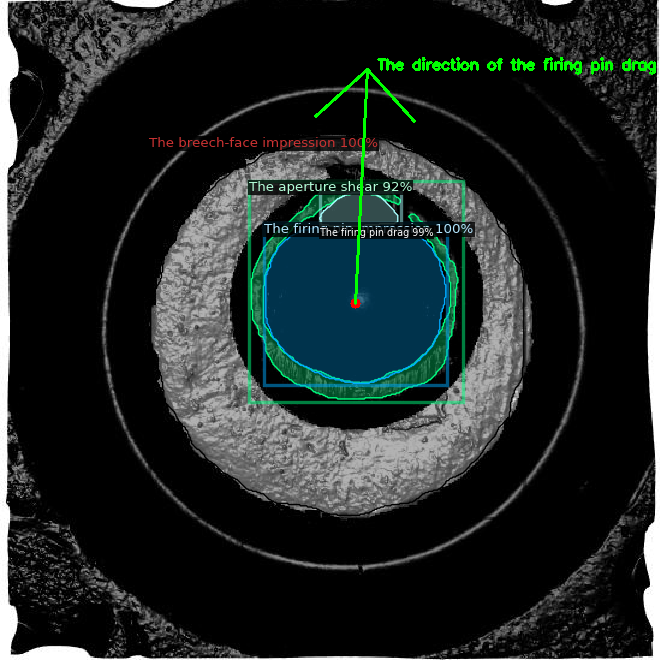

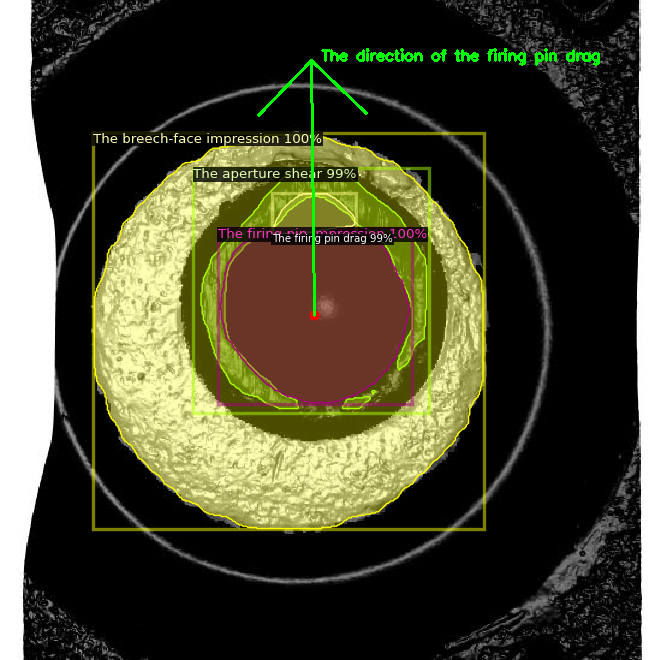

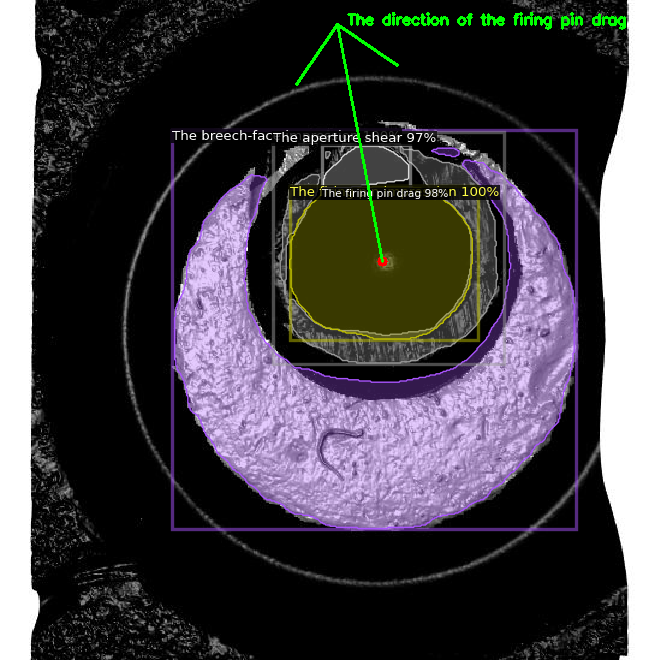

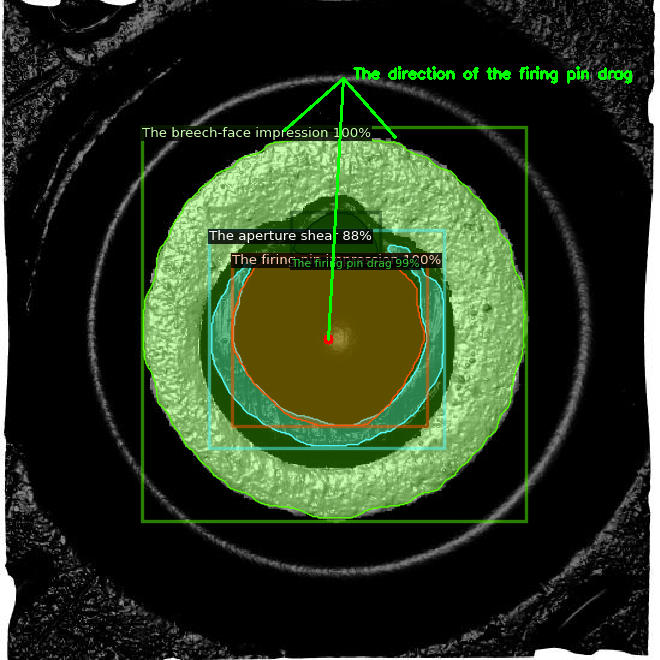

In [18]:
import os
import cv2
import time
import random
import numpy as np
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import ColorMode, Visualizer
from google.colab.patches import cv2_imshow
from detectron2.data import MetadataCatalog

# Function to process and display a single image
def process_and_display_image(image_path, predictor, cfg, metadata):
    im = cv2.imread(image_path)
    outputs = predictor(im)

    instances = outputs["instances"].to("cpu")
    class_ids = instances.pred_classes
    prediction_boxes = instances.pred_boxes.tensor

    class_catalog = metadata.thing_classes

    # Indices for different classes
    class_index_firing_pin_impression = 4  # Adjust according to your classes
    class_index_firing_pin_drag = 3        # Adjust according to your classes

    firing_pin_impression_coords = None
    firing_pin_drag_coords = None

    for idx, box in enumerate(prediction_boxes):
        class_index = class_ids[idx].item()
        if class_index == class_index_firing_pin_impression:
            firing_pin_impression_coords = box.numpy()
        elif class_index == class_index_firing_pin_drag:
            firing_pin_drag_coords = box.numpy()

    # Calculate the center points and edge point if both coordinates are available
    if firing_pin_impression_coords is not None and firing_pin_drag_coords is not None:
        # Calculate centers
        center_impression = (int((firing_pin_impression_coords[0] + firing_pin_impression_coords[2]) / 2),
                            int((firing_pin_impression_coords[1] + firing_pin_impression_coords[3]) / 2))

        center_drag = (int((firing_pin_drag_coords[0] + firing_pin_drag_coords[2]) / 2),
                      int((firing_pin_drag_coords[1] + firing_pin_drag_coords[3]) / 2))

        # Calculate the direction vector and the edge point
        direction = (center_drag[0] - center_impression[0], center_drag[1] - center_impression[1])
        scalar = 1.5
        edge_point = (center_drag[0] + direction[0] * scalar, center_drag[1] + direction[1] * scalar)

        # Original image dimensions
        original_height, original_width = im.shape[:2]

        # Create a Visualizer object and draw the instance predictions (including masks)
        v = Visualizer(im[:, :, ::-1], metadata=my_dataset_metadata, scale=1.2, instance_mode=ColorMode.IMAGE_BW)
        out = v.draw_instance_predictions(instances)

        # Convert the visualizer output image for OpenCV and get its dimensions
        output_image = out.get_image()[:, :, ::-1]
        visualized_height, visualized_width = output_image.shape[:2]

        # Calculate scale factors
        scale_x = visualized_width / original_width
        scale_y = visualized_height / original_height

        # Scale the coordinates
        scaled_center_impression = (int(center_impression[0] * scale_x), int(center_impression[1] * scale_y))
        scaled_center_drag = (int(center_drag[0] * scale_x), int(center_drag[1] * scale_y))
        scaled_edge_point = (int(edge_point[0] * scale_x), int(edge_point[1] * scale_y))

        # Convert the visualizer output image for OpenCV
        output_image = out.get_image()[:, :, ::-1]
        output_image = np.ascontiguousarray(output_image)  # Convert to contiguous array format for OpenCV compatibility

        # Draw a circle at the centroid of the firing pin impression
        cv2.circle(output_image, scaled_center_impression, 5, (0, 0, 255), -1)

        arrow_color = (0, 255, 0)  # Green color for the arrow
        cv2.arrowedLine(output_image, scaled_center_impression, scaled_edge_point, arrow_color, 2, tipLength=0.3)

        # Adding a label at the end of the arrow
        label = 'The direction of the firing pin drag'
        # Position the text slightly away from the arrow end to avoid overlap
        label_position = (scaled_edge_point[0] + 10, scaled_edge_point[1])
        cv2.putText(output_image, label, label_position, cv2.FONT_HERSHEY_SIMPLEX, 0.5, arrow_color, 2)

        # Display the image with the masks, arrow, and label
        cv2_imshow(output_image)


# Load the trained model
my_dataset_metadata = MetadataCatalog.get("Masking-Case-1-train")

cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # Path to the trained model
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.65   # Set a threshold

predictor = DefaultPredictor(cfg)

# Metadata for visualization
my_dataset_metadata = MetadataCatalog.get("Masking-Case-1-train")


test_folder_path = '/content/masking_catridge-2/test/'
test_image_files = os.listdir(test_folder_path)

# Randomly pick 4 images
num_images_to_display = 4  # Number of images to display
if len(test_image_files) >= num_images_to_display:
    selected_files = random.sample(test_image_files, num_images_to_display)
else:
    selected_files = test_image_files

# Process and display the selected images
for file_name in selected_files:
    image_path = os.path.join(test_folder_path, file_name)
    process_and_display_image(image_path, predictor, cfg, my_dataset_metadata)
    time.sleep(0.5)
    print("\n" * 5)


## **5. Model Evaluation**


Finally, Evaluating the trained model by making predictions on test images. This step involves loading the trained model weights, setting an appropriate confidence threshold, and visualizing the predictions.

In [19]:
from detectron2.evaluation import COCOEvaluator

evaluator = COCOEvaluator("Masking-Case-1-test", ["bbox", "segm"], False, output_dir="/content/output")

In [20]:
from detectron2.data import build_detection_test_loader

data_loader = build_detection_test_loader(cfg, "Masking-Case-1-test")

WARNING [01/22 15:15:56 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[01/22 15:15:56 d2.data.datasets.coco]: Loaded 50 images in COCO format from /content/masking_catridge-2/test/_annotations.coco.json
[01/22 15:15:56 d2.data.build]: Distribution of instances among all 5 categories:
|   category    | #instances   |   category    | #instances   |   category    | #instances   |
|:-------------:|:-------------|:-------------:|:-------------|:-------------:|:-------------|
| The-breech-.. | 0            | The apertur.. | 84           | The breech-.. | 50           |
| The firing .. | 50           | The firing .. | 50           |               |              |
|     total     | 234          |               |              |               |              |
[01/22 15:15:56 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='cho

In [21]:
from detectron2.evaluation import inference_on_dataset

results = inference_on_dataset(trainer.model, data_loader, evaluator)

[01/22 15:16:07 d2.evaluation.evaluator]: Start inference on 50 batches
[01/22 15:16:08 d2.evaluation.evaluator]: Inference done 11/50. Dataloading: 0.0011 s/iter. Inference: 0.0452 s/iter. Eval: 0.0072 s/iter. Total: 0.0535 s/iter. ETA=0:00:02
[01/22 15:16:10 d2.evaluation.evaluator]: Total inference time: 0:00:02.345051 (0.052112 s / iter per device, on 1 devices)
[01/22 15:16:10 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:01 (0.040437 s / iter per device, on 1 devices)
[01/22 15:16:10 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[01/22 15:16:10 d2.evaluation.coco_evaluation]: Saving results to /content/output/coco_instances_results.json
[01/22 15:16:10 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
[01/22 15:16:10 d2.evaluation.fast_eval_api]: Evaluate annotation type *bbox*
[01/22 15:16:10 d2.evaluation.fast_eval_api]: C

## **6. Summary**
Our modeling journey using Detectron2 for the cartridge case image dataset has culminated in a robust model capable of identifying and segmenting specific forensic features. The model's performance was rigorously evaluated using the COCOEvaluator, providing us with a detailed understanding of its effectiveness.

### Model Performance Summary
The model achieved the following metrics, indicating a high level of accuracy in both bounding box and segmentation tasks:

- **Bounding Box (bbox) Average Precision (AP):**
  - AP at IoU=0.50:0.95 - **72.84%**
  - AP at IoU=0.50 - **89.33%**
  - AP at IoU=0.75 - **79.70%**

- **Segmentation (segm) Average Precision (AP):**
  - AP at IoU=0.50:0.95 - **66.40%**
  - AP at IoU=0.50 - **85.46%**
  - AP at IoU=0.75 - **67.35%**

These results are indicative of the model's proficiency in accurately detecting and delineating the specified features within the cartridge case images.

### Interpretation of Results
- The high AP values, particularly at IoU=0.50, signify that the model is highly capable of identifying the general location of the features.
- The consistent performance in both bbox and segm tasks underscores the model's robustness in both detection and precise segmentation.
- The relatively lower AP for small area objects could be attributed to the inherent challenge in detecting smaller features. This could be an area for further improvement.


### Per-Category Performance
The model demonstrates varied performance across different feature categories. Notably:
- **The breech-face impression**: Achieved the highest AP in both bbox and segm evaluations.
- **The firing pin impression and drag**: Showed strong segmentation capabilities.
- **The aperture shear**: Had comparatively lower AP, indicating potential areas for model improvement.
- **The firing pin drag**: Showed better segmentation capabilities.

</br>

## 7. Conclusion
1. Overall, the model exhibits robust performance in identifying and segmenting key features in cartridge case images, making it a valuable tool in forensic analysis.
2. The insights gained from this project could significantly aid in automating the analysis of cartridge cases, enhancing efficiency and accuracy in forensic investigations.


## 8. Future Enhancement



- Even though the aperture shear, while reasonably well-detected, shows room for improvement.
- Future work will focus on improving the model's performance in underperforming categories and further refining its ability to handle diverse image conditions.

It was a short amount of time. So I didn't get time to use the U-Net model. For the last couple of hours before submission, I tried to implement U-Net but my system crashed. Of course, it requires a lot of computational power.

</br>

## References

The development and evaluation of our machine learning model for cartridge case image analysis were informed and supported by a range of sources. Here are some key references that contributed to our project:

1. Duong, L. (2023). _"Thermodynamics Analysis of A Novel Designation of Renewable Energy Systems"_. Retrieved from [ETS Montreal](https://espace2.etsmtl.ca/id/eprint/27282/1/Duong-L-2023-27282.pdf).
2. _"How to Cluster Images Based on Visual Similarity"_. Towards Data Science. Retrieved from [towardsdatascience.com](https://towardsdatascience.com/how-to-cluster-images-based-on-visual-similarity-cd6e7209fe34).
3. Stack Overflow Discussion on Detectron2 Object Detection. Retrieved from [stackoverflow.com](https://stackoverflow.com/questions/67516185/in-detectron-2-how-could-i-get-detected-object-class-name-and-the-bounding-box-x).
4. Detectron2 Official Documentation. Retrieved from [detectron2.readthedocs.io](https://detectron2.readthedocs.io/en/latest/tutorials/training.html).
5. Schwert, H. (2021). _"Digging Into Detectron 2 Part 5-6"_. Medium. Retrieved from [medium.com](https://medium.com/@hirotoschwert/digging-into-detectron-2-part-5-6e220d762f9).
6. Dataset: _"Topographic Scans of Breech Face Impressions on Cartridge Case Primers"_. Retrieved from [Iowa State University Digital Repository](https://iastate.figshare.com/articles/dataset/Topographic_Scans_of_Breech_Face_Impressions_on_Cartridge_Case_Primers/23837100?file=42400335).
7. NIST Video on Forensic Marks on a Cartridge Case. Retrieved from [National Institute of Standards and Technology](https://www.nist.gov/video/forensic-marks-cartridge-case).
